In [1]:
pip install matplotlib scikit-learn


  Using cached matplotlib-3.10.1-cp313-cp313-macosx_11_0_arm64.whl.metadata (11 kB)
  Using cached scikit_learn-1.6.1-cp313-cp313-macosx_12_0_arm64.whl.metadata (31 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.57.0-cp313-cp313-macosx_10_13_universal2.whl.metadata (102 kB)
  Using cached kiwisolver-1.4.8-cp313-cp313-macosx_11_0_arm64.whl.metadata (6.2 kB)
  Using cached pillow-11.2.1-cp313-cp313-macosx_11_0_arm64.whl.metadata (8.9 kB)
  Using cached pyparsing-3.2.3-py3-none-any.whl.metadata (5.0 kB)
  Using cached scipy-1.15.2-cp313-cp313-macosx_14_0_arm64.whl.metadata (61 kB)
  Using cached joblib-1.4.2-py3-none-any.whl.metadata (5.4 kB)
  Using cached threadpoolctl-3.6.0-py3-none-any.whl.metadata (13 kB)
Using cached matplotlib-3.10.1-cp313-cp313-macosx_11_0_arm64.whl (8.0 MB)
Using cached scikit_learn-1.6.1-cp313-cp313-macosx_12_0_arm64.whl (11.1 MB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
Using cached fonttools-4.57.0-cp

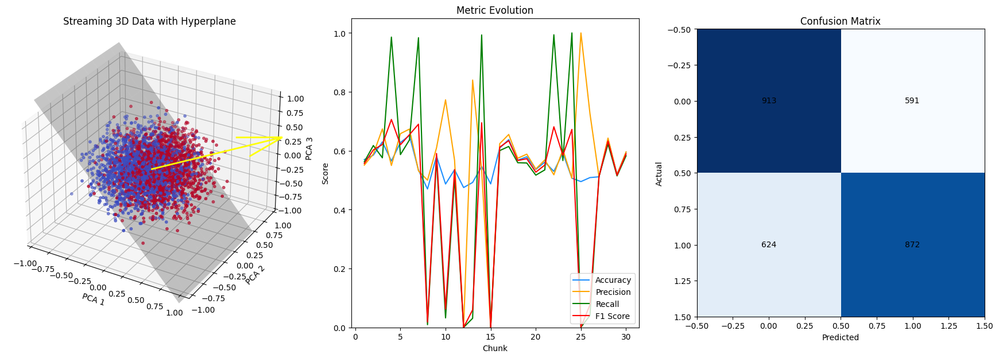

In [ ]:
# Install dependencies if needed
# !pip install matplotlib scikit-learn

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.linear_model import Perceptron
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, confusion_matrix
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import matplotlib as mpl

mpl.rcParams['animation.embed_limit'] = 50

# Load data files
data = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.data")
labels = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.labels")

# PCA to 3D
pca = PCA(n_components=3)
data_3d = pca.fit_transform(data)

chunk_size = 100
num_chunks = min(30, len(data_3d) // chunk_size)

# Metrics
metric_log = {
    "accuracy": [],
    "precision": [],
    "recall": [],
    "f1_score": []
}

# Plot setup
fig = plt.figure(figsize=(20, 6))
ax_3d = fig.add_subplot(131, projection='3d')
ax_metrics = fig.add_subplot(132)
ax_confusion = fig.add_subplot(133)

# Lines
accuracy_line, = ax_metrics.plot([], [], label="Accuracy", color="dodgerblue")
precision_line, = ax_metrics.plot([], [], label="Precision", color="orange")
recall_line, = ax_metrics.plot([], [], label="Recall", color="green")
f1_line, = ax_metrics.plot([], [], label="F1 Score", color="red")
lines = {
    "accuracy": accuracy_line,
    "precision": precision_line,
    "recall": recall_line,
    "f1_score": f1_line
}

# Init
def init():
    ax_3d.set_xlim(data_3d[:, 0].min(), data_3d[:, 0].max())
    ax_3d.set_ylim(data_3d[:, 1].min(), data_3d[:, 1].max())
    ax_3d.set_zlim(data_3d[:, 2].min(), data_3d[:, 2].max())
    ax_3d.set_title("Streaming 3D Data with Hyperplane")
    ax_3d.set_xlabel("PCA 1")
    ax_3d.set_ylabel("PCA 2")
    ax_3d.set_zlabel("PCA 3")

    ax_metrics.set_title("Metric Evolution")
    ax_metrics.set_xlabel("Chunk")
    ax_metrics.set_ylabel("Score")
    ax_metrics.set_ylim(0, 1.05)
    ax_metrics.legend(loc="lower right")

    ax_confusion.set_title("Confusion Matrix")
    return list(lines.values())

# Update
def update(frame):
    ax_3d.cla()
    ax_confusion.cla()

    end = (frame + 1) * chunk_size
    X = data_3d[:end]
    y = labels[:end]

    clf = Perceptron()
    clf.fit(X, y)
    preds = clf.predict(X)

    if len(np.unique(y)) < 2:
        return list(lines.values())

    acc = accuracy_score(y, preds)
    prec = precision_score(y, preds, zero_division=0)
    rec = recall_score(y, preds, zero_division=0)
    f1 = f1_score(y, preds, zero_division=0)

    metric_log["accuracy"].append(acc)
    metric_log["precision"].append(prec)
    metric_log["recall"].append(rec)
    metric_log["f1_score"].append(f1)

    # 3D Plot
    ax_3d.scatter(X[:, 0], X[:, 1], X[:, 2], c=y, cmap='coolwarm', s=10)
    ax_3d.set_title(f"Chunk {frame+1}")
    ax_3d.set_xlabel("PCA 1")
    ax_3d.set_ylabel("PCA 2")
    ax_3d.set_zlabel("PCA 3")

    coef = clf.coef_[0]
    intercept = clf.intercept_[0]
    a, b, c = coef / (np.linalg.norm(coef) + 1e-8)

    xx, yy = np.meshgrid(
        np.linspace(X[:, 0].min(), X[:, 0].max(), 10),
        np.linspace(X[:, 1].min(), X[:, 1].max(), 10)
    )
    zz = (-a * xx - b * yy - intercept) / (c + 1e-8)
    ax_3d.plot_surface(xx, yy, zz, alpha=0.3, color="gray", edgecolor='none')

    origin = np.mean(X, axis=0)
    ax_3d.quiver(origin[0], origin[1], origin[2], a, b, c, length=2, color='yellow', linewidth=2)

    # Metric plots
    x_vals = list(range(1, len(metric_log["accuracy"]) + 1))
    for key in metric_log:
        lines[key].set_data(x_vals, metric_log[key])

    ax_metrics.relim()
    ax_metrics.autoscale_view()

    # Confusion matrix
    cm = confusion_matrix(y, preds)
    ax_confusion.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax_confusion.set_title("Confusion Matrix")
    ax_confusion.set_xlabel("Predicted")
    ax_confusion.set_ylabel("Actual")

    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax_confusion.text(j, i, format(cm[i, j], 'd'),
                              ha="center", va="center", color="black")

    return list(lines.values())

ani = FuncAnimation(fig, update, frames=num_chunks, init_func=init,
                    interval=1000, blit=False, repeat=False)

HTML(ani.to_jshtml())


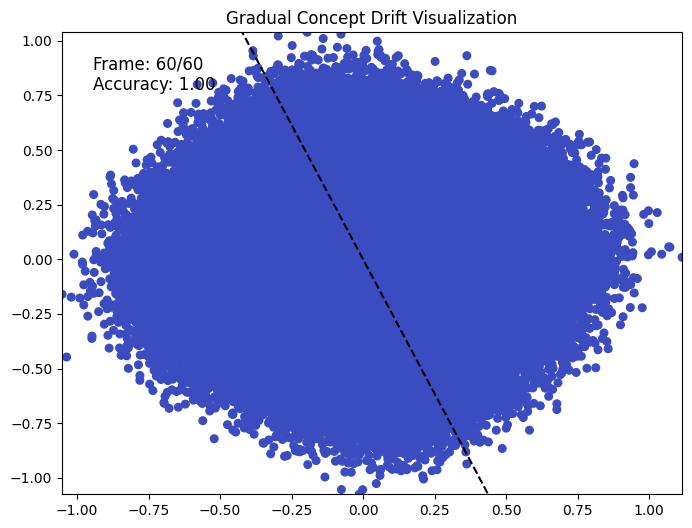

In [14]:
# Visualizing 4 Types of Concept Drift using the Rotating Hyperplane Dataset

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.linear_model import Perceptron
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from IPython.display import HTML

# Load the original rotating hyperplane dataset
data = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.data")
labels = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.labels")

# Apply PCA for 2D visualization
pca = PCA(n_components=2)
data_2d = pca.fit_transform(data)

# Define concept drift types

def apply_drift_labels(data, drift_type, frame, total_frames):
    n_features = data.shape[1]
    if drift_type == "sudden":
        if frame < total_frames // 2:
            w = np.ones(n_features)
        else:
            w = -np.ones(n_features)
    elif drift_type == "gradual":
        alpha = min(1, frame / (total_frames // 2))
        w = (1 - alpha) * np.ones(n_features) + alpha * (-np.ones(n_features))
    elif drift_type == "incremental":
        angle = np.pi * frame / total_frames
        w = np.cos(angle) * np.ones(n_features)
    elif drift_type == "recurring":
        w = np.ones(n_features) if (frame % 40 < 20) else -np.ones(n_features)
    else:
        w = np.ones(n_features)

    y_drift = (data @ w > 0).astype(int)
    return y_drift, w

# Animation setup
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter([], [], c=[], cmap='coolwarm', s=30)
line = ax.plot([], [], 'k--')[0]
text = ax.text(0.05, 0.95, '', transform=ax.transAxes, fontsize=12, verticalalignment='top')

drift_type = "gradual"  # change to: gradual, incremental, recurring
total_frames = 60

# Init

def init():
    ax.set_xlim(data_2d[:, 0].min(), data_2d[:, 0].max())
    ax.set_ylim(data_2d[:, 1].min(), data_2d[:, 1].max())
    ax.set_title(f"{drift_type.title()} Concept Drift Visualization")
    return sc, line, text

# Update per frame
def update(frame):
    y_drift, w = apply_drift_labels(data, drift_type, frame, total_frames)
    preds = (data @ w > 0).astype(int)
    acc = accuracy_score(y_drift, preds)

    sc.set_offsets(data_2d)
    sc.set_array(preds)

    # Decision boundary
    w2d = pca.transform([w])[0]
    slope = -w2d[0] / (w2d[1] + 1e-6)
    intercept = 0
    x_vals = np.array(ax.get_xlim())
    y_vals = slope * x_vals + intercept
    line.set_data(x_vals, y_vals)

    text.set_text(f"Frame: {frame+1}/{total_frames}\nAccuracy: {acc:.2f}")
    return sc, line, text

ani = FuncAnimation(fig, update, frames=total_frames, init_func=init, interval=500, blit=False)
HTML(ani.to_html5_video())

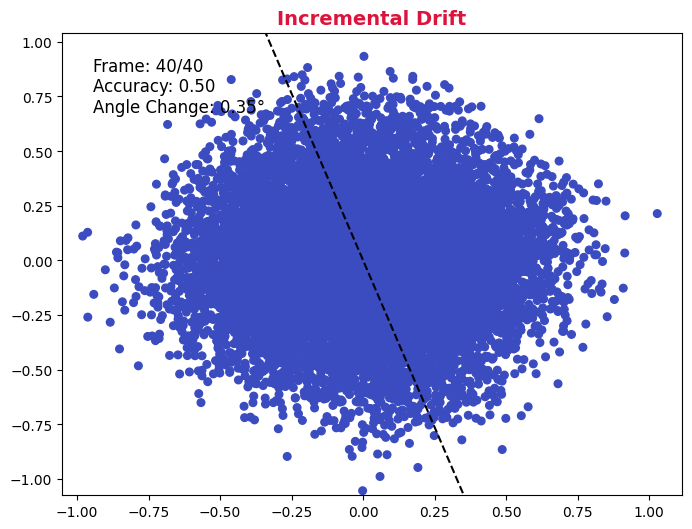

In [22]:
# Streaming Concept Drift Detection with Visual Drift Type Overlay

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from sklearn.metrics import accuracy_score
from sklearn.decomposition import PCA
from IPython.display import HTML

# Load the rotating hyperplane dataset
data = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.data")
labels = np.loadtxt("/Users/nikleshvarma/Downloads/rotatingHyperplane.labels")

# Apply PCA for 2D visualization
pca = PCA(n_components=2)
data_2d = pca.fit_transform(data)

# Streaming setup
chunk_size = 300
total_frames = min(40, len(data) // chunk_size)

# History
history_w = []
angle_history = []
drift_labels = []

# Plot setup
fig, ax = plt.subplots(figsize=(8, 6))
sc = ax.scatter([], [], c=[], cmap='coolwarm', s=30)
line = ax.plot([], [], 'k--')[0]
text = ax.text(0.05, 0.95, '', transform=ax.transAxes, fontsize=12, verticalalignment='top')
drift_box = ax.text(0.5, 1.02, '', transform=ax.transAxes, fontsize=14, ha='center', color='crimson', weight='bold')

# Init function
def init():
    ax.set_xlim(data_2d[:, 0].min(), data_2d[:, 0].max())
    ax.set_ylim(data_2d[:, 1].min(), data_2d[:, 1].max())
    ax.set_title(" ")
    return sc, line, text, drift_box

# Drift classifier
def classify_drift_type(angle_history):
    if len(angle_history) < 3:
        return ""
    recent = angle_history[-3:]
    if recent[-1] > 0.8 and recent[-2] < 0.2:
        return "Sudden Drift"
    elif 0.3 < recent[-1] < 1.5 and recent[-2] < recent[-1]:
        return "Gradual Drift"
    elif abs(recent[-1] - recent[-2]) < 0.2 and 0.3 < recent[-1] < 1.5:
        return "Incremental Drift"
    elif len(angle_history) > 10 and abs(angle_history[-1] - angle_history[-11]) < 0.2:
        return "Recurring Drift"
        
# Frame update
def update(frame):
    end = (frame + 1) * chunk_size
    X_chunk = data[:end]
    X2d_chunk = data_2d[:end]
    y_chunk = labels[:end]

    w = np.mean(X_chunk[y_chunk == 1], axis=0) - np.mean(X_chunk[y_chunk == 0], axis=0)
    history_w.append(w)

    angle = 0
    drift_type = ""
    if len(history_w) > 1:
        prev_w = history_w[-2]
        cos_sim = np.dot(prev_w, w) / (np.linalg.norm(prev_w) * np.linalg.norm(w) + 1e-8)
        angle = np.arccos(np.clip(cos_sim, -1, 1)) * 180 / np.pi
        angle_history.append(angle)
        if angle > 0.2:
            drift_type = classify_drift_type(angle_history)

    preds = (X_chunk @ w > 0).astype(int)
    acc = accuracy_score(y_chunk, preds)

    sc.set_offsets(X2d_chunk)
    sc.set_array(preds)

    # Boundary
    w2d = pca.transform([w])[0]
    slope = -w2d[0] / (w2d[1] + 1e-6)
    x_vals = np.array(ax.get_xlim())
    y_vals = slope * x_vals
    line.set_data(x_vals, y_vals)

    # Labels
    text.set_text(f"Frame: {frame+1}/{total_frames}\nAccuracy: {acc:.2f}\nAngle Change: {angle:.2f}°")
    drift_box.set_text(drift_type if drift_type else "")
    return sc, line, text, drift_box

# Animate
ani = FuncAnimation(fig, update, frames=total_frames, init_func=init, interval=700, blit=False)
HTML(ani.to_jshtml())